In [1]:
import torch
import os

In [2]:
from importlib.metadata import version
print(version("ragas"))  # 0.3.9

from ragas import evaluate
print("Ragas import works")

0.3.9


/opt/anaconda3/envs/tf/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Ragas import works


In [3]:
from dotenv import load_dotenv,set_key
load_dotenv()

True

In [4]:
import requests
doc_path="/Users/adnaniqbalkantroo/Downloads/Human-Nutrition-2020-Edition-1598491699.pdf"
os.path.exists(doc_path)

True

In [5]:
import pymupdf
import fitz
from tqdm.auto import tqdm

In [84]:
from platform import python_version
print(python_version())

3.12.13


In [6]:
def text_formatter(text:str) ->str:
    clean_text=text.replace("\n"," ").strip()
    return clean_text

def open_and_read_pdf(doc_path:str)->list[dict]:
    doc=fitz.open(doc_path)
    pages_and_texts=[]
    for page_number,page in tqdm(enumerate(doc)):
        text=page.get_text()
        text=text_formatter(text)
        pages_and_texts.append({
                                "page_number":page_number-41,
                                "page_char_count":len(text),
                                "page_word_count":len(text.split(" ")),
                                "page_sentence_count_raw":len(text.split(". ")),
                                "page_token_count":len(text)/4,
                                "text":text
                                }
                              )
    return pages_and_texts

pages_and_texts=open_and_read_pdf(doc_path)

1208it [00:01, 1038.65it/s]


In [7]:
import random
random.sample(pages_and_texts,k=3)

[{'page_number': 595,
  'page_char_count': 1240,
  'page_word_count': 208,
  'page_sentence_count_raw': 3,
  'page_token_count': 310.0,
  'text': 'Antioxidant  Antioxidant  Source  Antioxidant Function  Vitamin A  Karat banana,  beef liver,  chicken liver  Protects cellular membranes, prevents  glutathione depletion, maintains free  radical detoxifying enzyme systems,  reduces inflammation  Vitamin E  Sunflower  seeds, almonds,  sunflower oil  Protects cellular membranes,\xa0 prevents  glutathione depletion  Vitamin C  Oranges,  grapefruit  Protects DNA, RNA, proteins, and lipids,  aids in regenerating vitamin E  Vitamin D  Swordfish,  salmon, tuna  fish canned in  water and  drained  Regulates blood calcium levels in  concert with parathyroid hormone  Carotenoids Pumpkin,  carrots  Free radical scavenger  Learning Activities  Technology Note: The second edition of the Human  Nutrition Open Educational Resource (OER) textbook  features interactive learning activities.\xa0 These activit

In [8]:
import pandas as pd
df=pd.DataFrame(pages_and_texts)

In [9]:
df.describe()

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count
count,1208.00000,1208.000000,1208.000000,1208.000000,1208.000000
mean,562.50000,1148.004139,198.299669,9.972682,287.001035
std,348.86387,560.382275,95.759336,6.187226,140.095569
min,-41.00000,0.000000,1.000000,1.000000,0.000000
25%,260.75000,762.000000,134.000000,4.000000,190.500000
50%,562.50000,1231.500000,214.500000,10.000000,307.875000
75%,864.25000,1603.500000,271.000000,14.000000,400.875000
max,1166.00000,2308.000000,429.000000,32.000000,577.000000


In [10]:
def fixed_chunking(text:str,chunk_size: int=500) ->list:
    chunks=[]
    current_chunk=""
    words=text.split()
    for word in words:
        if len(word)+len(current_chunk) +1<=chunk_size:
            current_chunk+=(word +' ')
        else:
            chunks.append(current_chunk.strip())
            current_chunk=word + ' '
    if current_chunk:
        chunks.append(current_chunk.strip())
    return chunks

def fixed_chunking_pdf_pages(pages_and_texts:list,chunk_size:int=500) ->list[dict]:
    all_chunks=[]
    for page in pages_and_texts:
        page_number=page['page_number']
        page_text=page['text']

        chunks=fixed_chunking(page_text,chunk_size=chunk_size)
        for i,chunk in enumerate(chunks):
            all_chunks.append({
                'page_number':page_number,
                'chunk_index':i,
                'chunk_char_count':len(chunk),
                'chunk_word_count':len(chunk.split()),
                "chunk_token_count":len(chunk)/4,
                "chunk_text":chunk
            })
    return all_chunks

In [11]:
fixed_size_chunks=fixed_chunking_pdf_pages(pages_and_texts)

In [12]:
random.sample(fixed_size_chunks,k=3)

[{'page_number': 20,
  'chunk_index': 0,
  'chunk_char_count': 498,
  'chunk_word_count': 74,
  'chunk_token_count': 124.5,
  'chunk_text': 'available in the web-based textbook and not available in the downloadable versions (EPUB, Digital PDF, Print_PDF, or Open Document). Learning activities may be used across various mobile devices, however, for the best user experience it is strongly recommended that users complete these activities using a desktop or laptop computer and in Google Chrome. An interactive or media element has been excluded from this version of the text. You can view it online here: http://pressbooks.oer.hawaii.edu/'},
 {'page_number': 1055,
  'chunk_index': 0,
  'chunk_char_count': 499,
  'chunk_word_count': 82,
  'chunk_token_count': 124.75,
  'chunk_text': 'red meat only a few times per month, having up to seven eggs per week, and drinking red wine in moderation. Unlike most diets, the Mediterranean diet does not cut fat consumption across the board. Instead, it inco

In [13]:
from sentence_transformers import SentenceTransformer,util
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import nltk
nltk.download('punkt',quiet=True)
nltk.download('punkt_tab',quiet=True)

True

In [14]:
semantic_model=SentenceTransformer("sentence-transformers/all-mpnet-base-v2")

Loading weights: 100%|█████████████████████| 199/199 [00:00<00:00, 6777.04it/s]


In [15]:
def semantic_chunking(text:str,similarity_threshold:float=0.8,max_tokens: int=500) ->list:

    sentences=nltk.sent_tokenize(text)
    if not sentences:
        return []
    embeddings=semantic_model.encode(sentences)
    chunks=[]
    current_chunk=[sentences[0]]
    current_embedding=embeddings[0]

    for i in range(1,len(sentences)):
        similarity=cosine_similarity([current_embedding],[embeddings[i]])[0][0]
        chunk_token_count=len(" ".join(current_chunk))//4

        if similarity>=similarity_threshold and chunk_token_count<=max_tokens:
            current_chunk.append(sentences[i])
        else:
            chunks.append(" ".join(current_chunk))
            current_chunk=[sentences[i]]
            current_embedding=embeddings[i]
    if current_chunk:
        chunks.append(" ".join(current_chunk))        
    return chunks

def semantic_chunking_pdf_pages(pages_and_texts:list,similarity_threshold:float=0.55,max_tokens:int=500) ->list[dict]:
    all_chunks=[]
    for page in tqdm(pages_and_texts,desc="Semantic chunking pages"):
        page_number=page['page_number']
        page_text=page['text']

        chunks=semantic_chunking(page_text,similarity_threshold=similarity_threshold,max_tokens=max_tokens)
        for i,chunk in enumerate(chunks):
            all_chunks.append({
                'page_number':page_number,
                'chunk_index':i,
                'chunk_char_count':len(chunk),
                'chunk_word_count':len(chunk.split()),
                "chunk_token_count":len(chunk)/4,
                "chunk_text":chunk
            })
    return all_chunks
            

In [16]:
semantic_chunks=semantic_chunking_pdf_pages(pages_and_texts)

Semantic chunking pages: 100%|█████████████| 1208/1208 [01:22<00:00, 14.58it/s]


In [17]:
random.sample(semantic_chunks,k=5)

[{'page_number': 821,
  'chunk_index': 6,
  'chunk_char_count': 228,
  'chunk_word_count': 37,
  'chunk_token_count': 57.0,
  'chunk_text': 'After the birth of the baby, nutritional needs must be met to  ensure that an infant not only survives, but thrives from infancy  into childhood. Breastfeeding provides the fuel a newborn needs for  rapid growth and development.'},
 {'page_number': 411,
  'chunk_index': 3,
  'chunk_char_count': 110,
  'chunk_word_count': 18,
  'chunk_token_count': 27.5,
  'chunk_text': 'This state of  imbalance can occur in people who have certain diseases, such  as cancer or muscular dystrophy.'},
 {'page_number': 760,
  'chunk_index': 3,
  'chunk_char_count': 2,
  'chunk_word_count': 1,
  'chunk_token_count': 0.5,
  'chunk_text': '1.'},
 {'page_number': 647,
  'chunk_index': 5,
  'chunk_char_count': 42,
  'chunk_word_count': 8,
  'chunk_token_count': 10.5,
  'chunk_text': 'You can  Summary of Major Minerals  |  647'},
 {'page_number': 508,
  'chunk_index': 4,
  

In [18]:
len(semantic_chunks)

9205

In [19]:
def recursive_chunking(text:str,max_chunk_size: int=1000, min_chunk_size: int=100) ->list:
    
    def split_chunk(chunk:str) ->list:
        if len(chunk)<max_chunk_size:
            return [chunk]
        
        ###Chunk by sections
        sections=chunk.split("\n\n")
        if len(sections)>1:
            result=[]
            for section in sections:
                if section.strip():
                    result.extend(split_chunk(section.strip()))
            return result

        ###Chunk by paragraphs
        sections=chunk.split("\n")
        if len(sections)>1:
            result=[]
            for section in sections:
                if section.strip():
                    result.extend(split_chunk(section.strip()))
            return result

        ###If everything fails, chunk by sentence
        sentences=nltk.sent_tokenize(chunk)
        chunks,current_chunk,current_size=[],[],0
        for sentence in sentences:
            if current_size + len(sentence) >max_chunk_size:
                if current_chunk:
                    chunks.append(" ".join(current_chunk))
                current_chunk=[sentence]
                current_size=len(sentence)
            else:
                current_chunk.append(sentence)
                current_size+=len(sentence)
        if current_chunk:
            chunks.append(" ".join(current_chunk))

        return chunks
        
    return split_chunk(text)

def recursive_chunking_pdf_pages(pages_and_texts:list,max_chunk_size:int=1000,min_chunk_size:int=100) ->list[dict]:
    all_chunks=[]
    for page in tqdm(pages_and_texts,desc="Recursively chunking pages"):
        page_number=page['page_number']
        page_text=page['text']

        chunks=recursive_chunking(page_text,max_chunk_size=max_chunk_size, min_chunk_size=min_chunk_size)
        for i,chunk in enumerate(chunks):
            all_chunks.append({
                'page_number':page_number,
                'chunk_index':i,
                'chunk_char_count':len(chunk),
                'chunk_word_count':len(chunk.split()),
                "chunk_token_count":len(chunk)/4,
                "chunk_text":chunk
            })
    return all_chunks

In [20]:
recursive_chunks=recursive_chunking_pdf_pages(pages_and_texts)

Recursively chunking pages: 100%|███████| 1208/1208 [00:00<00:00, 12622.78it/s]


In [21]:
random.sample(recursive_chunks,k=5)

[{'page_number': 969,
  'chunk_index': 1,
  'chunk_char_count': 384,
  'chunk_word_count': 43,
  'chunk_token_count': 96.0,
  'chunk_text': 'Antioxidant nutrients  Antioxidant nutrients play an important role in protecting cell  9. Nutrition and Athletic Performance. (2016). American  College of Sports Medicine. Medicine & Science in Sports  & Exercise, 48(3), 543- 568. \xa0https://journals.lww.com/ acsm-msse/Fulltext/2016/03000/ Nutrition_and_Athletic_Performance.25.aspx. Accessed  March 17, 2018. Sports Nutrition  |  969'},
 {'page_number': 1119,
  'chunk_index': 0,
  'chunk_char_count': 978,
  'chunk_word_count': 144,
  'chunk_token_count': 244.5,
  'chunk_text': 'Disease Prevention and Management  Eating fresh, healthy foods not only stimulates your taste buds, but  also can improve your quality of life and help you to live longer. As discussed, food fuels your body and helps you to maintain a  healthy weight. Nutrition also contributes to longevity and plays an  important role in 

In [22]:
len(recursive_chunks)

2007

In [23]:
import re
import textwrap

def _is_chapter_header_page(text:str)->bool:
    return re.search(r"university\s+of\s+hawai",text,flags=re.IGNORECASE) is not None

def _guess_title_from_page(text:str) ->str:

    m=re.search(r"university\s+of\s+hawai",text,flags=re.IGNORECASE)
    if m:
        title=text[:m.start()].strip()

        title=re.sub(r"\s+"," ",title).strip()
        if 10<=len(title)<=180:
            return title
    title=re.sub(r"\s+"," ",title).strip()
    return title[:120] if title else "Untitled Chapter"

def structural_chunking_pdf_pages(pages_and_texts:list[dict]) ->list[dict]:

    if not pages_and_texts:
        return []

    chapter_starts=[]
    for i,p in enumerate(pages_and_texts):
        txt=p['text']
        if _is_chapter_header_page(txt):
            chapter_starts.append(i)
    if not chapter_starts:
        all_text=" ".join(p['text'] for p in pages_and_texts).strip()
        return [{
            "chapter_index":0,
            "title":_guess_title_from_page(pages_and_texts[0]['text']),
            "page_start":pages_and_texts[0]['page_number'],
            "page_end":pages_and_texts[-1]['page_number'],
            "chunk_char_count":len(all_text),
            "chunk_word_count":len(all_text.split()),
            "chunk_token_count":round(len(all_text)/4,2),
            "chunk_text":all_text
        }]

    chapter_chunks=[]
    for chapter_index,start_page in enumerate(chapter_starts):
        end_page=(chapter_starts[chapter_index+1]-1) if (chapter_index+1<len(chapter_starts)) else (len(pages_and_texts)-1)

        if end_page<start_page:
            continue
        pages=pages_and_texts[start_page:end_page+1]
        text_concat=" ".join(p["text"] for p in pages ).strip()
        title=_guess_title_from_page(pages[0]['text'])

        chapter_chunks.append(
            {
            "chapter_index":chapter_index,
            "title":title,
            "page_start":pages[0]['page_number'],
            "page_end":pages[-1]['page_number'],
            "chunk_char_count":len(text_concat),
            "chunk_word_count":len(text_concat.split()),
            "chunk_token_count":round(len(text_concat)/4,2),
            "chunk_text":text_concat
            }
        )
    return chapter_chunks
    

In [24]:
structural_chunks=structural_chunking_pdf_pages(pages_and_texts)

In [25]:
random.sample(structural_chunks,k=5)

[{'chapter_index': 118,
  'title': 'Selenium',
  'page_start': 675,
  'page_end': 680,
  'chunk_char_count': 5451,
  'chunk_word_count': 811,
  'chunk_token_count': 1362.75,
  'chunk_text': 'Selenium  UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN  NUTRITION PROGRAM AND HUMAN NUTRITION PROGRAM  Selenium is a cofactor of enzymes that release active thyroid  hormone in cells and therefore low levels can cause similar signs  and symptoms as iodine deficiency. The other important function of  selenium is as an antioxidant.  Selenium Functions and Health Benefits  Around twenty-five known proteins require selenium to function.  Some are enzymes involved in detoxifying free radicals and include  glutathione peroxidases and thioredoxin reductase. As an integral  functioning part of these enzymes, selenium aids in the  regeneration of glutathione and oxidized vitamin C. Selenium as  part of glutathione peroxidase also protects lipids from free  radicals, and, in doing so, spares vitamin

In [26]:
temp_df=pd.DataFrame(structural_chunks)

In [27]:
temp_df.describe()

,chapter_index,page_start,page_end,chunk_char_count,chunk_word_count,chunk_token_count
count,171.000000,171.000000,171.000000,171.000000,171.000000,171.000000
mean,85.000000,423.222222,429.274854,8115.649123,1214.801170,2028.912281
std,49.507575,383.624537,386.154298,8731.087834,1312.500983,2182.771958
min,0.000000,-39.000000,-39.000000,166.000000,25.000000,41.500000
25%,42.500000,25.500000,31.000000,2276.000000,355.500000,569.000000
50%,85.000000,363.000000,373.000000,5457.000000,819.000000,1364.250000
75%,127.500000,729.000000,741.500000,11501.000000,1734.000000,2875.250000
max,170.000000,1156.000000,1166.000000,59153.000000,8900.000000,14788.250000


<Axes: xlabel='chunk_token_count', ylabel='Density'>

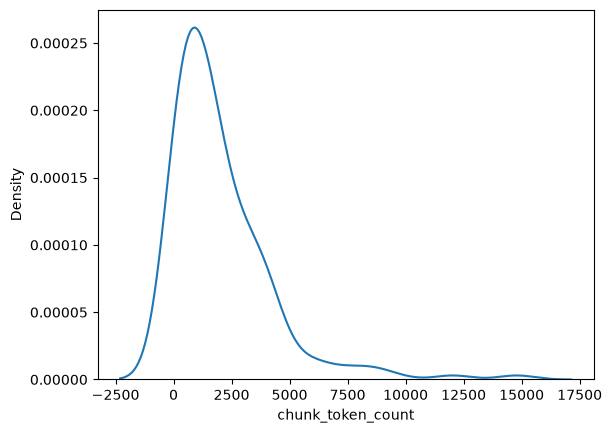

In [28]:
import seaborn as sns
sns.kdeplot(temp_df['chunk_token_count'])

In [29]:
###**Chunking done at Sentence level with the help of spacy lib**

In [30]:
from spacy.lang.en import English

In [31]:
nlp=English()
nlp.add_pipe('sentencizer')
for item in tqdm(pages_and_texts):
    item["sentences"]=list(nlp(item["text"]).sents)
    item["sentences"]=[str(sentence) for sentence in item["sentences"]]
    

100%|████████████████████████████████████| 1208/1208 [00:00<00:00, 1572.86it/s]


In [32]:
num_sentence_chunks=10
def split_sentence_list(input_list: list, slice_size: int) ->list[list[str]]:
    return [input_list[i:i+slice_size] for i in range(0,len(input_list),slice_size)]

for item in tqdm(pages_and_texts):
    item['sentence_chunks']=split_sentence_list(item['sentences'],num_sentence_chunks)
    item["num_chunks"]=len(item['sentence_chunks'])


100%|█████████████████████████████████| 1208/1208 [00:00<00:00, 2100629.86it/s]


In [33]:
temp_df=pd.DataFrame(pages_and_texts)
temp_df.describe()

,page_number,page_char_count,page_word_count,page_sentence_count_raw,page_token_count,num_chunks
count,1208.00000,1208.000000,1208.000000,1208.000000,1208.000000,1208.000000
mean,562.50000,1148.004139,198.299669,9.972682,287.001035,1.525662
std,348.86387,560.382275,95.759336,6.187226,140.095569,0.644397
min,-41.00000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,260.75000,762.000000,134.000000,4.000000,190.500000,1.000000
50%,562.50000,1231.500000,214.500000,10.000000,307.875000,1.000000
75%,864.25000,1603.500000,271.000000,14.000000,400.875000,2.000000
max,1166.00000,2308.000000,429.000000,32.000000,577.000000,3.000000


In [34]:
###Now let's make a new list of dict that is based upon chunks and not pages.

In [35]:
pages_and_chunks=[]

for item in tqdm(pages_and_texts):
    for sentence_chunk in item["sentence_chunks"]:
        chunk_dict={}
        chunk_dict["page_number"]=item["page_number"]

        joined_sentence_chunk="".join(sentence_chunk).replace("  "," ").strip()
        joined_sentence_chunk=re.sub(r'\.([A-Z])', r'. \1',joined_sentence_chunk)
        chunk_dict["sentence_chunk"]=joined_sentence_chunk
        chunk_dict["chunk_char_count"]=len(joined_sentence_chunk)
        chunk_dict["chunk_word_count"]=len(joined_sentence_chunk.split())
        chunk_dict["chunk_token_count"]=round(len(joined_sentence_chunk)/4,2)

        pages_and_chunks.append(chunk_dict)

100%|███████████████████████████████████| 1208/1208 [00:00<00:00, 78432.19it/s]


In [36]:
random.sample(pages_and_chunks,k=3)

[{'page_number': 13,
  'sentence_chunk': 'recommended that users complete these activities using a desktop or laptop computer and in Google Chrome. \xa0 An interactive or media element has been excluded from this version of the text. You can view it online here: http://pressbooks.oer.hawaii.edu/ humannutrition2/?p=46 \xa0 An interactive or media element has been excluded from this version of the text. You can view it online here: http://pressbooks.oer.hawaii.edu/ humannutrition2/?p=46 Introduction | 13',
  'chunk_char_count': 459,
  'chunk_word_count': 63,
  'chunk_token_count': 114.75},
 {'page_number': 886,
  'sentence_chunk': 'who regularly participate in sports or exercise need to eat a greater number of calories to account for increased energy expenditures. For carbohydrates, the AMDR is 45 to 65 percent of daily calories (which is a recommended daily allowance of 158–228 grams for 1,400–1,600 daily calories). Carbohydrates that are high in fiber should make up the bulk of intake.

In [37]:
len(pages_and_chunks)

1843

In [38]:
temp_df=pd.DataFrame(pages_and_chunks)
temp_df.describe()


,page_number,chunk_char_count,chunk_word_count,chunk_token_count
count,1843.000000,1843.000000,1843.000000,1843.000000
mean,583.381443,734.442756,112.562127,183.610689
std,347.788670,447.541546,71.258067,111.885387
min,-41.000000,12.000000,3.000000,3.000000
25%,280.500000,315.000000,45.000000,78.750000
50%,586.000000,746.000000,115.000000,186.500000
75%,890.000000,1118.500000,173.000000,279.625000
max,1166.000000,1831.000000,297.000000,457.750000


In [39]:
min_token_count=30
temp_chunks=temp_df[temp_df['chunk_token_count']>min_token_count].to_dict(orient='records')
random.sample(temp_chunks,k=3)

[{'page_number': 1073,
  'sentence_chunk': 'Image by Jennifer Draper / CC BY 4.0 Image by CDC / Unsplash License Intuitive Eating Intuitive eating is a non-diet approach to eating that promotes a Calories In Versus Calories Out | 1073',
  'chunk_char_count': 190,
  'chunk_word_count': 34,
  'chunk_token_count': 47.5},
 {'page_number': 982,
  'sentence_chunk': 'Learning Activities Technology Note: The second edition of the Human Nutrition Open Educational Resource (OER) textbook features interactive learning activities.\xa0 These activities are available in the web-based textbook and not available in the downloadable versions (EPUB, Digital PDF, Print_PDF, or Open Document). Learning activities may be used across various mobile devices, however, for the best user experience it is strongly recommended that users complete these activities using a desktop or laptop computer and in Google Chrome. \xa0 An interactive or media element has been excluded from this version of the text. You can v

In [40]:
torch.mps.is_available()

True

In [41]:
for item in tqdm(temp_chunks):
    item['embeddings']=semantic_model.encode(item['sentence_chunk'])

100%|██████████████████████████████████████| 1680/1680 [00:48<00:00, 34.85it/s]


In [85]:
temp_chunks

Task was destroyed but it is pending!
task: <Task pending name='Task-2' coro=<Kernel.shell_main() running at /opt/anaconda3/envs/tf/lib/python3.12/site-packages/ipykernel/kernelbase.py:597> cb=[Task.task_wakeup()]>
Task was destroyed but it is pending!
task: <Task pending name='Task-3' coro=<_async_in_context.<locals>.run_in_context() running at /opt/anaconda3/envs/tf/lib/python3.12/site-packages/ipykernel/utils.py:60> wait_for=<Task pending name='Task-24' coro=<Kernel.shell_main() running at /opt/anaconda3/envs/tf/lib/python3.12/site-packages/ipykernel/kernelbase.py:597> cb=[Task.__wakeup()]> cb=[ZMQStream._run_callback.<locals>._log_error() at /opt/anaconda3/envs/tf/lib/python3.12/site-packages/zmq/eventloop/zmqstream.py:564]>
/opt/anaconda3/envs/tf/lib/python3.12/site-packages/numpy/_core/arrayprint.py:1048: RuntimeWarning: coroutine 'Kernel.shell_main' was never awaited
  int_part, frac_part = zip(*(s.split('.') for s in frac_strs))
Task was destroyed but it is pending!
task: <Task

[{'page_number': -39,
  'sentence_chunk': 'Human Nutrition: 2020 Edition UNIVERSITY OF HAWAI‘I AT MĀNOA FOOD SCIENCE AND HUMAN NUTRITION PROGRAM ALAN TITCHENAL, SKYLAR HARA, NOEMI ARCEO CAACBAY, WILLIAM MEINKE-LAU, YA-YUN YANG, MARIE KAINOA FIALKOWSKI REVILLA, JENNIFER DRAPER, GEMADY LANGFELDER, CHERYL GIBBY, CHYNA NICOLE CHUN, AND ALLISON CALABRESE',
  'chunk_char_count': 308,
  'chunk_word_count': 42,
  'chunk_token_count': 77.0,
  'embeddings': array([ 6.74242526e-02,  9.02282372e-02, -5.09550748e-03, -3.17545682e-02,
          7.39082024e-02,  3.51976380e-02, -1.97986457e-02,  4.67692502e-02,
          5.35727330e-02,  5.01232408e-03,  3.33929360e-02, -1.62223424e-03,
          1.76081024e-02,  3.62654105e-02, -3.16701218e-04, -1.07118459e-02,
          1.54258171e-02,  2.62176767e-02,  2.77660857e-03,  3.64942476e-02,
         -4.44109552e-02,  1.89361982e-02,  4.90117744e-02,  1.64020322e-02,
         -4.85782921e-02,  3.18293413e-03,  2.72992551e-02, -2.04754365e-03,
         -1

In [42]:
sentence_chunk_and_embedding_df=pd.DataFrame(temp_chunks)
sentence_chunk_and_embedding_df_path="sentence_chunk_and_embedding.csv"
sentence_chunk_and_embedding_df.to_csv(sentence_chunk_and_embedding_df_path,index=False)

In [43]:
sentence_chunk_and_embedding_df.head()

,page_number,sentence_chunk,chunk_char_count,chunk_word_count,chunk_token_count,embeddings
0,-39,Human Nutrition: 2020 Edition UNIVERSITY OF HA...,308,42,77.00,"[0.06742425, 0.09022824, -0.0050955075, -0.031..."
1,-38,Human Nutrition: 2020 Edition by University of...,210,30,52.50,"[0.05521559, 0.059213948, -0.016616736, -0.020..."
2,-37,Contents Preface University of Hawai‘i at Māno...,766,116,191.50,"[0.027980182, 0.033981446, -0.020642659, 0.001..."
3,-36,Lifestyles and Nutrition University of Hawai‘i...,941,144,235.25,"[0.06825668, 0.038127456, -0.0084685385, -0.01..."
4,-35,The Cardiovascular System University of Hawai‘...,998,152,249.50,"[0.033026412, -0.008497664, 0.009571602, -0.00..."


In [44]:
import numpy as np
sentence_chunk_and_embedding_df=pd.read_csv('sentence_chunk_and_embedding.csv')
sentence_chunk_and_embedding_df['embeddings']=sentence_chunk_and_embedding_df['embeddings'].apply(lambda x:np.fromstring(x.strip("[]"),sep=' '))
pages_and_chunks=sentence_chunk_and_embedding_df.to_dict(orient="records")
embeddings=torch.tensor(np.array(sentence_chunk_and_embedding_df['embeddings'].tolist()),dtype=torch.float32)

In [45]:
query="symptoms of pellagra"

In [46]:
embeddings=embeddings.to("mps")

In [47]:
query_embedding=semantic_model.encode(query,convert_to_tensor=True)

In [48]:
import time
start=time.time()
dot_scores=util.dot_score(a=query_embedding,b=embeddings)[0]
end=time.time()
print(end-start)

0.0007448196411132812


In [49]:
top_results_dot_product=torch.topk(dot_scores,k=5)
top_results_dot_product

torch.return_types.topk(
values=tensor([0.5000, 0.3741, 0.2959, 0.2793, 0.2721], device='mps:0'),
indices=tensor([ 822,  853, 1536, 1555, 1531], device='mps:0'))

In [50]:
def retrieve_relevant_chunks(query,embeddings,model=semantic_model,n_resources=5):
    
    query_embedding=semantic_model.encode(query,convert_to_tensor=True).to("mps")
    dot_scores=util.dot_score(a=query_embedding,b=embeddings)[0]
    scores,indices=torch.topk(dot_scores,k=5)

    return scores,indices

In [51]:
import textwrap

def print_text_helper(text,wrap_length=80):
    wrapped_text=textwrap.fill(text,wrap_length)
    print(wrapped_text)

print(f"Query: '{query}'\n")
print("Results: ")
for score,idx in zip(top_results_dot_product[0],top_results_dot_product[1]):
    print(f"score: {score:.4f}")
    print("Text: ")
    print_text_helper(pages_and_chunks[idx]['sentence_chunk'])

    print(f"Page Number: {pages_and_chunks[idx]['page_number']}")
    print("\n")
    

Query: 'symptoms of pellagra'

Results: 
score: 0.5000
Text: 
Niacin deficiency is commonly known as pellagra and the symptoms include
fatigue, decreased appetite, and indigestion.  These symptoms are then commonly
followed by the four D’s: diarrhea, dermatitis, dementia, and sometimes death.
Figure 9.12  Conversion of Tryptophan to Niacin Water-Soluble Vitamins | 565
Page Number: 565


score: 0.3741
Text: 
car. Does it drive faster with a half-tank of gas or a full one?It does not
matter; the car drives just as fast as long as it has gas. Similarly, depletion
of B vitamins will cause problems in energy metabolism, but having more than is
required to run metabolism does not speed it up. Buyers of B-vitamin supplements
beware; B vitamins are not stored in the body and all excess will be flushed
down the toilet along with the extra money spent. B vitamins are naturally
present in numerous foods, and many other foods are enriched with them. In the
United States, B-vitamin deficiencies are

In [52]:
torch.mps.current_allocated_memory() / (2**30)

0.4133424758911133

In [53]:
from huggingface_hub import login
login()

In [54]:
from transformers import AutoTokenizer,AutoModelForCausalLM
attn_implementation="sdpa"s

In [55]:
tokenizer=AutoTokenizer.from_pretrained('google/gemma-2-2b-it')

In [56]:
llm_model=AutoModelForCausalLM.from_pretrained('google/gemma-2-2b-it',torch_dtype=torch.float16,attn_implementation=attn_implementation)

[transformers] `torch_dtype` is deprecated! Use `dtype` instead!
Loading weights: 100%|███████████████████████| 288/288 [00:06<00:00, 44.17it/s]


In [57]:
sum([param.numel() for param in llm_model.parameters()])/1000_000_000

2.614341888

In [58]:
def prompt_formatter(query:str,context_items: list[dict]) ->str:
    
    context="- " + "\n- ".join([item['sentence_chunk'] for item in context_items])

    base_prompt="""Based on the following context items, please answer the query.
Give yourself room to think by extracting relevant passages from the context before answering the query.Don't return the thinking, only return the answer.
Make sure your answers are as explanatory as possible.
Use the following examples as references for the ideal answer style.
\nExample 1:
Query:what are the fat-soluble vitamins?
Answer:The fat soluble vitamins include Vitamin A, Vitamin D, Vitamin E, Vitamin K. These vitamins are absorbed along with  dietary fats through the small intestine and are stored in the body's liver and fatty tissues.
\nExample 2:
Query:what are the causes of type 2 diabetes?
Answer:Type 2 diabetes is often associated with overnutrition,particularly the overconsumption of calories leading to obesity.
\nNow use the following context items to answer the user query:
{context}. The context contains the answer. Look carefully and extract the relevant information.
\nRelevant passages: <extract relevant passages from the context here>
User query:{query}
Answer:"""
    base_prompt=base_prompt.format(context=context,query=query)

    dialogue_template=[
        {
        "role":"user","content":base_prompt
    }
    ]
    prompt=tokenizer.apply_chat_template(conversation=dialogue_template,tokenize=False,add_generation_prompt=True)

    return prompt
    
    

In [59]:
context_items=[pages_and_chunks[i] for i in top_results_dot_product[1]]
input_text=prompt_formatter(query=query,context_items=context_items)

In [60]:
input_ids=tokenizer(input_text,return_tensors="pt")
outputs=llm_model.generate(**input_ids,temperature=0.7,do_sample=True,max_new_tokens=512)

In [61]:
output_text=tokenizer.decode(outputs[0])
output_text=output_text.replace(input_text,"")
final_output=re.sub(r'<bos>|<end_of_turn>','',output_text)
print(final_output)

The symptoms of pellagra include fatigue, decreased appetite, and indigestion. These symptoms are then commonly followed by the four D’s: diarrhea, dermatitis, dementia, and sometimes death. 



In [62]:
####Evaluation of Results

In [63]:
from importlib.metadata import version
print(version("ragas"))  # must be 0.3.9

0.3.9


In [64]:
from datasets import Dataset
from ragas import evaluate
from ragas.metrics import (
context_precision,
context_recall,
answer_relevancy,
faithfulness,
context_entity_recall
)

In [65]:
# Define evaluation questions and ground truth answers
eval_questions = [
    "How often should infants be breastfed?",
    "What are symptoms of pellagra?",
    "How does saliva help with digestion?",
    "What is the recommended protein intake per day, based on your weight?",
    "What are micronutrients?"
]

ground_truth_answers = [
    "A newborn infant (birth to 28 days) requires feedings eight to twelve times a day or more. Between 1 and 3 months of age, the breastfed infant becomes more efficient, and the number of feedings per day often become fewer even though the amount of milk consumed stays the same.",

    "Niacin deficiency is commonly known as pellagra and the symptoms include fatigue, decreased appetite, and indigestion. These symptoms are then commonly followed by the four D's: diarrhea, dermatitis, dementia, and sometimes death.",

    "The mechanical and chemical digestion of carbohydrates begins in the mouth. Chewing, also known as mastication, crumbles the carbohydrate foods into smaller and smaller pieces. The salivary glands in the oral cavity secrete saliva that coats the food particles. Saliva contains the enzyme, salivary amylase. This enzyme breaks the bonds between the monomeric sugar units of disaccharides, oligosaccharides, and starches. The salivary amylase breaks down amylose and amylopectin into smaller chains of glucose, called dextrins and maltose",

    "your exact recommended protein intake per day based on your weight by using the following equation: (Weight in lbs: 2.2 lb/kg) × 0.8 g/kg. Note that if a person is overweight, the amount of dietary protein recommended can be overestimated",

    "Micronutrients are nutrients required by the body in lesser amounts, but are still essential for carrying out bodily functions. Micronutrients include all the essential minerals and vitamins."
]

In [66]:
def generate_rag_answers(query):
    scores,indices=retrieve_relevant_chunks(query,embeddings=embeddings)
    context_items=[pages_and_chunks[i] for i in indices]
    prompt=prompt_formatter(query,context_items)

    input_ids=tokenizer(prompt,return_tensors="pt")
    outputs=llm_model.generate(**input_ids,temperature=0.7,do_sample=True,max_new_tokens=512)

    output_text=tokenizer.decode(outputs[0])
    temp_output=output_text.replace(prompt,"").strip()
    final_output=re.sub(r'<bos>|<end_of_turn>','',temp_output)

    contexts=[item['sentence_chunk'] for item in context_items]

    return final_output,contexts

In [67]:
query="How often should infants be breastfed?"
generate_rag_answers(query)

('An exclusively breastfed infant needs to be breastfed eight to twelve times a day or more in the first 28 days of life. After about six months, infants can gradually begin to consume solid foods to help meet nutrient needs. \n',
 ['milk is the best source to fulfill nutritional requirements. An exclusively breastfed infant does not even need extra water, including in hot climates. A newborn infant (birth to 28 days) requires feedings eight to twelve times a day or more. Between 1 and 3 months of age, the breastfed infant becomes more efficient, and the number of feedings per day often become fewer even though the amount of milk consumed stays the same. After about six months, infants can gradually begin to consume solid foods to help meet nutrient needs. Foods that are added in addition to breastmilk are called complementary foods. Complementary foods should be nutrient dense to provide optimal nutrition. Complementary foods include baby meats, vegetables, fruits, infant cereal, and 

In [68]:
evaluation_data=[]
for eval_question,ground_truth_answer in zip(eval_questions,ground_truth_answers):

    rag_answer,contexts=generate_rag_answers(eval_question)

    evaluation_data.append(
        {
            'question':eval_question,
            'answer':rag_answer,
            'contexts':contexts,
            'ground_truth':ground_truth_answer,
        }
    )

In [69]:
evaluation_data

[{'question': 'How often should infants be breastfed?',
  'answer': 'Infants need to be fed eight to twelve times a day (or more) in the first 28 days of life.  After about six months, infants become more efficient and the number of feedings per day often becomes fewer, even though the amount of milk consumed stays the same. \n',
  'contexts': ['milk is the best source to fulfill nutritional requirements. An exclusively breastfed infant does not even need extra water, including in hot climates. A newborn infant (birth to 28 days) requires feedings eight to twelve times a day or more. Between 1 and 3 months of age, the breastfed infant becomes more efficient, and the number of feedings per day often become fewer even though the amount of milk consumed stays the same. After about six months, infants can gradually begin to consume solid foods to help meet nutrient needs. Foods that are added in addition to breastmilk are called complementary foods. Complementary foods should be nutrient d

In [70]:
##from langchain_openai import ChatOpenAI
##ChatOpenAI(model="gpt-4o-mini", temperature=0)

In [71]:
#from langchain_openai import ChatOpenAI, OpenAIEmbeddings
#from ragas.llms import LangchainLLMWrapper
#from ragas.embeddings import LangchainEmbeddingsWrapper

#ragas_llm = LangchainLLMWrapper(ChatOpenAI(model="gpt-4o-mini", temperature=0))
#ragas_embeddings = LangchainEmbeddingsWrapper(OpenAIEmbeddings(model="text-embedding-3-small"))

In [72]:
# Groq judge LLM + local embedding model (no OpenAI embedding usage)
from ragas.run_config import RunConfig
from dotenv import load_dotenv

from langchain_groq import ChatGroq
from langchain_huggingface import HuggingFaceEmbeddings
from ragas.llms import LangchainLLMWrapper
from ragas.embeddings import LangchainEmbeddingsWrapper

ragas_llm = LangchainLLMWrapper(ChatGroq(model="qwen/qwen3.8-27b",temperature=0,max_retries=3,timeout=120,))
ragas_embeddings = LangchainEmbeddingsWrapper(HuggingFaceEmbeddings(model_name="sentence-transformers/all-MiniLM-L6-v2",model_kwargs={"device": "mps"},encode_kwargs={"normalize_embeddings": True},))
run_config = RunConfig(max_workers=1,max_retries=1,timeout=120)


/var/folders/sn/7wm4yk012259lm2kp57nzpkh0000gn/T/ipykernel_10816/98464807.py:10: DeprecationWarning: LangchainLLMWrapper is deprecated and will be removed in a future version. Use llm_factory instead: from openai import OpenAI; from ragas.llms import llm_factory; llm = llm_factory('gpt-4o-mini', client=OpenAI(api_key='...'))
  ragas_llm = LangchainLLMWrapper(ChatGroq(model="qwen/qwen3.8-27b",temperature=0,max_retries=3,timeout=120,))
Loading weights: 100%|█████████████████████| 103/103 [00:00<00:00, 7504.53it/s]
/var/folders/sn/7wm4yk012259lm2kp57nzpkh0000gn/T/ipykernel_10816/98464807.py:11: DeprecationWarning: LangchainEmbeddingsWrapper is deprecated and will be removed in a future version. Use the modern embedding providers instead: embedding_factory('openai', model='text-embedding-3-small', client=openai_client) or from ragas.embeddings import OpenAIEmbeddings, GoogleEmbeddings, HuggingFaceEmbeddings
  ragas_embeddings = LangchainEmbeddingsWrapper(HuggingFaceEmbeddings(model_name="s

In [73]:
metrics = [
    context_precision,
    context_recall,
    answer_relevancy,
    faithfulness,
]

answer_relevancy.strictness = 1
eval_dataset=Dataset.from_pandas(pd.DataFrame(evaluation_data))
print("Running RAGAS Evaluation: ")
results = evaluate(
    dataset=eval_dataset,
    metrics=metrics,
    llm=ragas_llm,
    embeddings=ragas_embeddings,
    run_config=run_config,
    raise_exceptions=True,
)
results_df=results.to_pandas()

Running RAGAS Evaluation: 


Evaluating:   0%|                                       | 0/20 [00:00<?, ?it/s]Exception in callback Task.__step()
handle: <Handle Task.__step()>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/tf/lib/python3.12/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
RuntimeError: cannot enter context: <_contextvars.Context object at 0x10783fa40> is already entered
Exception in callback Task.__step()
handle: <Handle Task.__step()>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/tf/lib/python3.12/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
RuntimeError: cannot enter context: <_contextvars.Context object at 0x10783fa40> is already entered
Exception in callback Task.__step()
handle: <Handle Task.__step()>
Traceback (most recent call last):
  File "/opt/anaconda3/envs/tf/lib/python3.12/asyncio/events.py", line 88, in _run
    self._context.run(self._callback, *self._args)
RuntimeError:

In [74]:
eval_dataset

Dataset({
    features: ['question', 'answer', 'contexts', 'ground_truth'],
    num_rows: 5
})

In [75]:
results_df.head()

,user_input,retrieved_contexts,response,reference,context_precision,context_recall,answer_relevancy,faithfulness
0,How often should infants be breastfed?,[milk is the best source to fulfill nutritiona...,Infants need to be fed eight to twelve times a...,A newborn infant (birth to 28 days) requires f...,1.000000,1.0,0.701708,0.400000
1,What are symptoms of pellagra?,[Niacin deficiency is commonly known as pellag...,"The symptoms of pellagra are fatigue, decrease...",Niacin deficiency is commonly known as pellagr...,1.000000,1.0,0.996590,1.000000
2,How does saliva help with digestion?,[Digestion and Absorption of Carbohydrates UNI...,Saliva contains the enzyme salivary amylase wh...,The mechanical and chemical digestion of carbo...,0.866667,1.0,0.915691,1.000000
3,What is the recommended protein intake per day...,[or when reducing energy intake.5 See Table 16...,The recommended protein intake for endurance a...,your exact recommended protein intake per day ...,1.000000,0.5,0.851024,0.666667
4,What are micronutrients?,[Water There is one other nutrient that we mus...,Micronutrients are nutrients required by the b...,Micronutrients are nutrients required by the b...,0.755556,1.0,0.958633,1.000000


In [77]:
metric_cols = []
for col in results_df.columns:
    if col not in ['user_input', 'retrieved_contexts', 'response', 'reference']:
        metric_cols.append(col)

In [78]:
avg_scores = {}
for col in metric_cols:
    avg_score = results_df[col].mean()
    avg_scores[col] = avg_score

    # Performance indicator
    if avg_score >= 0.8:
        indicator = " Excellent"
    elif avg_score >= 0.6:
        indicator = " Good"
    elif avg_score >= 0.4:
        indicator = "  Fair"
    else:
        indicator = " Poor"

    print(f"{col.replace('_', ' ').title():<25}: {avg_score:.3f} {indicator}")

# Performance summary
print(f"\n PERFORMANCE SUMMARY")
print("-" * 50)



Context Precision        : 0.924  Excellent
Context Recall           : 0.900  Excellent
Answer Relevancy         : 0.885  Excellent
Faithfulness             : 0.813  Excellent

 PERFORMANCE SUMMARY
--------------------------------------------------


In [79]:
# Count performance levels
excellent = sum(1 for score in avg_scores.values() if score >= 0.8)
good = sum(1 for score in avg_scores.values() if 0.6 <= score < 0.8)
fair = sum(1 for score in avg_scores.values() if 0.4 <= score < 0.6)
poor = sum(1 for score in avg_scores.values() if score < 0.4)

print(f" Excellent metrics: {excellent}")
print(f" Good metrics:      {good}")
print(f"  Fair metrics:      {fair}")
print(f" Poor metrics:      {poor}")

# Key insights
print(f"\n💡 KEY INSIGHTS")
print("-" * 50)

best_metric = max(avg_scores, key=avg_scores.get)
worst_metric = min(avg_scores, key=avg_scores.get)

print(f" Best performing:   {best_metric.replace('_', ' ').title()} ({avg_scores[best_metric]:.3f})")
print(f" Needs improvement: {worst_metric.replace('_', ' ').title()} ({avg_scores[worst_metric]:.3f})")

# Specific recommendations
if avg_scores.get('context_precision', 0) > 0.7 and avg_scores.get('answer_relevancy', 0) < 0.3:
    print(" Issue detected: Good retrieval but poor answer generation")
    print("   → Fix your prompt template to better use retrieved context")

if avg_scores.get('context_recall', 0) < 0.5:
    print("🔧 Issue detected: Poor context retrieval")
    print("   → Improve your embedding model or chunk strategy")

print(f"\n Results saved to 'rag_evaluation_results.csv'")

# Save detailed results
detailed_results = pd.DataFrame(evaluation_data)
for col in metric_cols:
    detailed_results[col] = results_df[col].values

detailed_results.to_csv('rag_evaluation_results.csv', index=False)

print("="*80)

 Excellent metrics: 4
 Good metrics:      0
  Fair metrics:      0
 Poor metrics:      0

💡 KEY INSIGHTS
--------------------------------------------------
 Best performing:   Context Precision (0.924)
 Needs improvement: Faithfulness (0.813)

 Results saved to 'rag_evaluation_results.csv'


In [ ]:
##import sys
##import subprocess
#with open("requirements.txt", "w") as f:subprocess.run([sys.executable, "-m", "pip", "freeze"],stdout=f,check=True)